# Data Visualization and Parsing

In [50]:
# imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from skimage.color import rgb2hsv
import cv2
from typing import Callable
from skimage.morphology import closing, opening, disk, remove_small_holes, remove_small_objects


In [51]:
#load data
train_df = pd.read_csv('train.csv')
sample_df = pd.read_csv('sample_submission.csv')

print("TRAIN CSV")
print(f"Shape: {train_df.shape}")
print(train_df.head())

print("\nAMPLE SUBMISSION")
print(f"Shape: {sample_df.shape}")
print(sample_df.head())

TRAIN CSV
Shape: (81, 7)
   image_id center_card active_player   player_1_cards  player_2_cards  \
0  L1000770         y_1            p3            EMPTY     y_4;g_2;r_3   
1  L1000771         r_5            p1      y_7;y_8;g_4           EMPTY   
2  L1000772         r_9            p2      y_8;b_6;g_3  b_skip;r_0;r_3   
3  L1000773         y_8            p4     r_1;wild;g_2           EMPTY   
4  L1000774         r_4            p3  g_4;g_8;r_7;b_3         r_9;g_3   

         player_3_cards player_4_cards  
0        r_skip;y_2;b_5          EMPTY  
1               r_9;y_0          EMPTY  
2           r_6;g_2;r_9   b_draw_2;y_7  
3  draw_4;g_reverse;y_1  y_reverse;r_3  
4          wild;y_3;r_8        b_7;b_6  

AMPLE SUBMISSION
Shape: (160, 7)
   image_id center_card active_player player_1_cards player_2_cards  \
0  L1000793       EMPTY         EMPTY          EMPTY          EMPTY   
1  L1000794       EMPTY         EMPTY          EMPTY          EMPTY   
2  L1000795       EMPTY         EMPTY

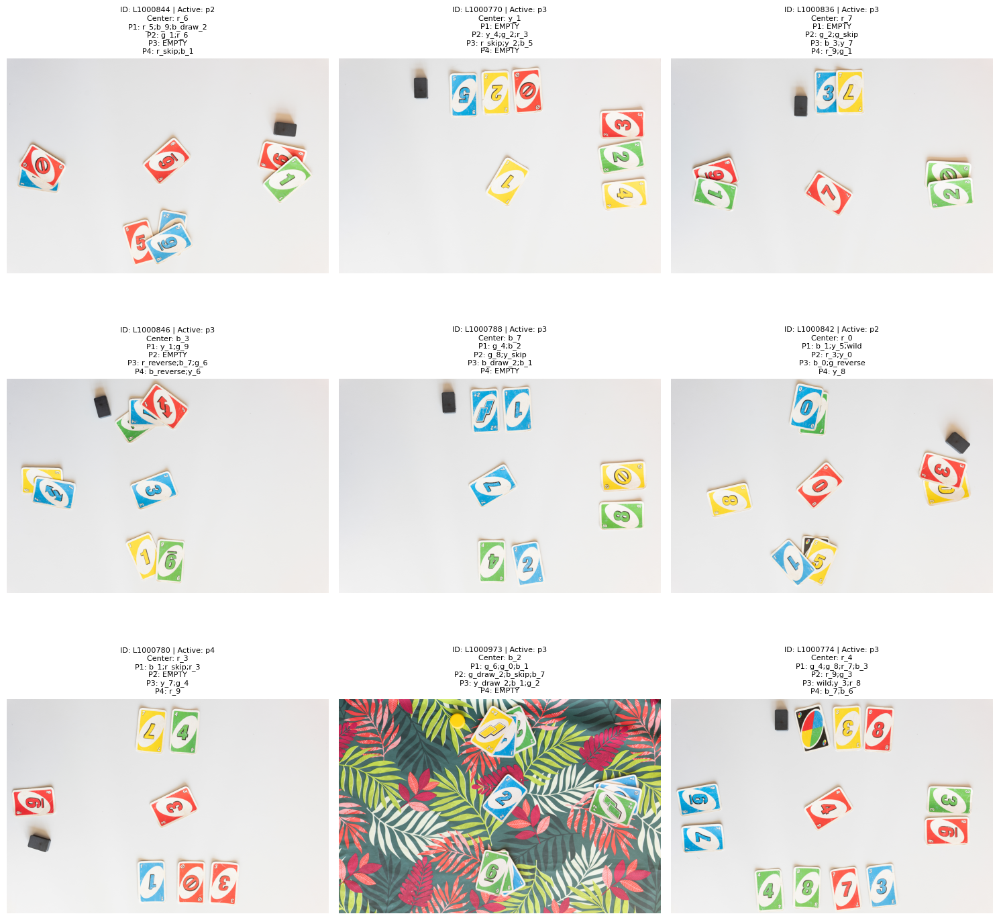

In [52]:
#visualize training images with their labels
train_image_dir = 'train_images/'

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

for i, (_, row) in enumerate(train_df.sample(9, random_state=42).iterrows()):
    img = Image.open(os.path.join(train_image_dir, row['image_id'] + '.jpg'))
    axes[i].imshow(img)
    title = (f"ID: {row['image_id']} | Active: {row['active_player']}\n"
             f"Center: {row['center_card']}\n"
             f"P1: {row['player_1_cards'][:20]}\n"
             f"P2: {row['player_2_cards'][:20]}\n"
             f"P3: {row['player_3_cards'][:20]}\n"
             f"P4: {row['player_4_cards'][:20]}")
    axes[i].set_title(title, fontsize=8)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Segmentation

In [53]:
#loading both the white background and noisy background images for comparison
img_white = np.array(Image.open('train_images/L1000770.jpg'))
img_noisy = np.array(Image.open('train_images/L1000902.jpg'))


The value-based method is not enough to discern the cards both images. In the noisy background image, we can see that some leaves are equally bright as the cards. We must look into other methods, or a combination of multiple HSV methods.


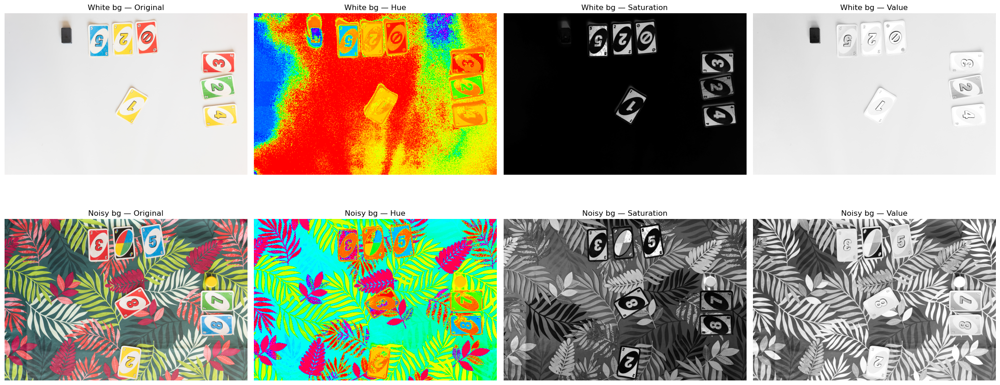

In [54]:
# comparing all HSV channels on both images
fig, axes = plt.subplots(2, 4, figsize=(22, 10))

for row_idx, (img, img_hsv, label) in enumerate([
    (img_white, img_white_hsv, 'White bg'),
    (img_noisy, img_noisy_hsv, 'Noisy bg')
]):
    axes[row_idx, 0].imshow(img)
    axes[row_idx, 0].set_title(f'{label} — Original')
    axes[row_idx, 0].axis('off')

    axes[row_idx, 1].imshow(img_hsv[:,:,0], cmap='hsv')
    axes[row_idx, 1].set_title(f'{label} — Hue')
    axes[row_idx, 1].axis('off')

    axes[row_idx, 2].imshow(img_hsv[:,:,1], cmap='gray')
    axes[row_idx, 2].set_title(f'{label} — Saturation')
    axes[row_idx, 2].axis('off')

    axes[row_idx, 3].imshow(img_hsv[:,:,2], cmap='gray')
    axes[row_idx, 3].set_title(f'{label} — Value')
    axes[row_idx, 3].axis('off')

plt.tight_layout()
plt.show()

## The takeaway here is, to segment the cards we can characterize them by : 
1. High VALUE threshold → finds the white parts of cards (works on both backgrounds)
2. Find rectangular contours in that mask → cards are rectangles, leaves are not
3. Filter by aspect ratio + minimum area → keep only card-shaped regions

In [ ]:
# Extract HSV channels (like Lab 1)
def extract_hsv_channels(img):
    """
    Extract HSV channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.

    Return
    ------
    data_h: np.ndarray (M, N)
        Hue channel of input image
    data_s: np.ndarray (M, N)
        Saturation channel of input image
    data_v: np.ndarray (M, N)
        Value channel of input image
    """
    M, N, C = np.shape(img)

    data_h = np.zeros((M, N))
    data_s = np.zeros((M, N))
    data_v = np.zeros((M, N))

    img_hsv = rgb2hsv(img)
    data_h = img_hsv[:, :, 0]
    data_s = img_hsv[:, :, 1]
    data_v = img_hsv[:, :, 2]

    return data_h, data_s, data_v

In [56]:
# Cell 8 — Plot HSV distributions (like Lab 1)
def plot_colors_histo(
    img: np.ndarray,
    func: Callable,
    labels: list[str],
):
    channels = func(img=img)
    C2 = len(channels)
    M, N, C1 = img.shape
    fig = plt.figure(figsize=(16, 10))
    gs = fig.add_gridspec(3, C2)

    mask = np.random.RandomState(seed=0).rand(M, N) < 0.1

    ax = fig.add_subplot(gs[:2, :])
    ax.imshow(img)
    ax.axis('off')
    ax1 = fig.add_subplot(gs[2, 0])
    ax2 = fig.add_subplot(gs[2, 1])
    ax3 = fig.add_subplot(gs[2, 2])

    ax1.scatter(channels[0][mask].flatten(), channels[1][mask].flatten(), c=img[mask]/255, s=1, alpha=0.1)
    ax1.set_xlabel(labels[0])
    ax1.set_ylabel(labels[1])
    ax1.set_title("{} vs {}".format(labels[0], labels[1]))
    ax2.scatter(channels[0][mask].flatten(), channels[2][mask].flatten(), c=img[mask]/255, s=1, alpha=0.1)
    ax2.set_xlabel(labels[0])
    ax2.set_ylabel(labels[2])
    ax2.set_title("{} vs {}".format(labels[0], labels[2]))
    ax3.scatter(channels[1][mask].flatten(), channels[2][mask].flatten(), c=img[mask]/255, s=1, alpha=0.1)
    ax3.set_xlabel(labels[1])
    ax3.set_ylabel(labels[2])
    ax3.set_title("{} vs {}".format(labels[1], labels[2]))

    plt.tight_layout()

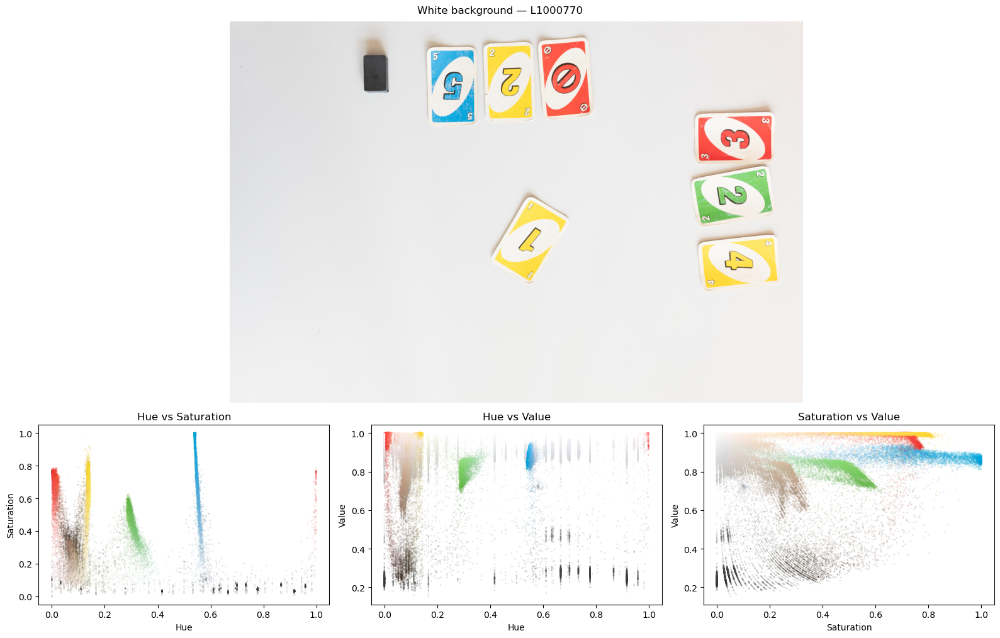

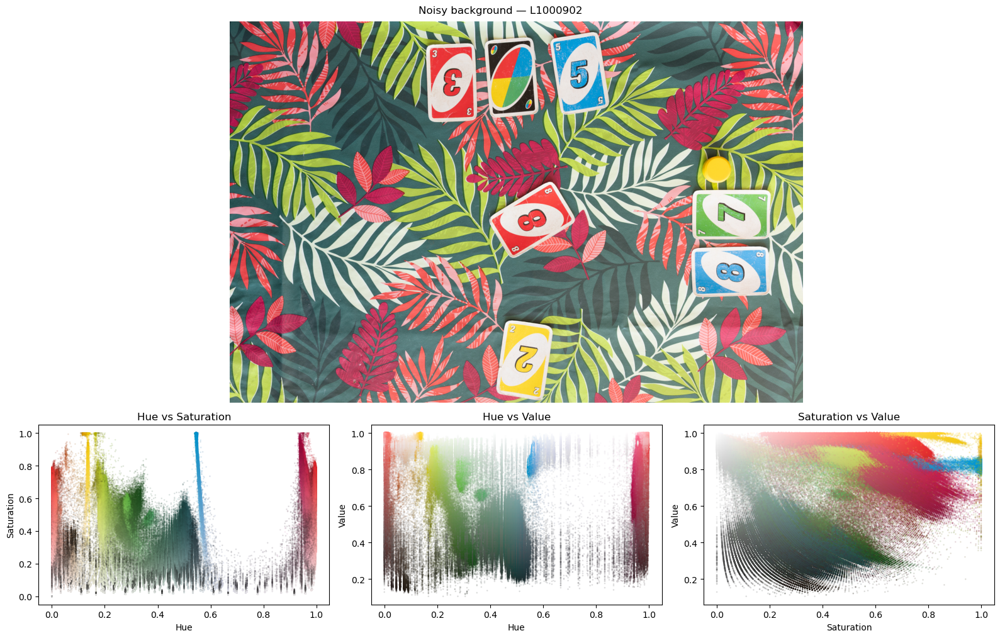

In [57]:
# Visualize HSV distributions for both images
plot_colors_histo(
    img=img_white,
    func=extract_hsv_channels,
    labels=['Hue', 'Saturation', 'Value']
)
plt.suptitle('White background — L1000770', y=1.01)
plt.show()

plot_colors_histo(
    img=img_noisy,
    func=extract_hsv_channels,
    labels=['Hue', 'Saturation', 'Value']
)
plt.suptitle('Noisy background — L1000902', y=1.01)
plt.show()

Here, we notice the following : 
1. For a white background, a saturation-based method is a clear winner ! Cards are bright while the background is dark.
2. For a noisy background, cards are low saturation islands surrounded by high saturation background. This is the opposite as the white background example.
   
White background → the background has low saturation (S<0.1>) but high value (V>0.8). That's the big white cloud bottom-right of Sat vs Value. the colored cards are clearly separated into clusters : red (H = 0.0), yellow (H=0.15), green (H=0.35) and blue (H=0.55). They all have high saturation. Also, the black token is low value (V<0.3) and low saturation.
 
Noisy background → Much more overlap between between background and cards. Cards still appear high saturation and high value points (top right of Sat vs Value). However, the background leaves spread across mid saturation values. 


Let's try and apply a threshold based on these values and visualize the resulting binary mask on both images.

 - White background : works great ! 
 - Noisy background : This is the core challenge, the red and green leaves have almost identical hue and saturation to the red and green cards. Pure HSV thresholding alone won't be enough to separate them. They key difference bwteen cards and leaved is elsewhere : it lies in shape and texture. 
 - Also, let's look at the wild card in the noisy background : Wild cards and draw_4 cards are special cases, because they have a black background with 4 colored sectors, a low overall saturation. Thus, our threshold misses them because the black part dominates.



Thus, we can move on to our third step : Morphology. Morphology will fill holes inside card regions by closing and remove tiny isolated noise pixels by opening, thus merging cards regions with their white borders. 


In this case, we try to eliminate leaf noise first, then consolidate cards. However, if we stard with closing, it would merge leaf regions with cards regions, making later separation harder. Also, let's note that cards are already fairly solid colored regions, not much noise inside them. For this reason, we chose to skip closing and opening : It could merge nearby regions (cards with leaves) or shring card region and lose card edge respectivelly. 

We therefore continue with applying remove_small_objects, to kill the tiny leaf fragments. And then, remove_small_holes, to futher solidy the cards.


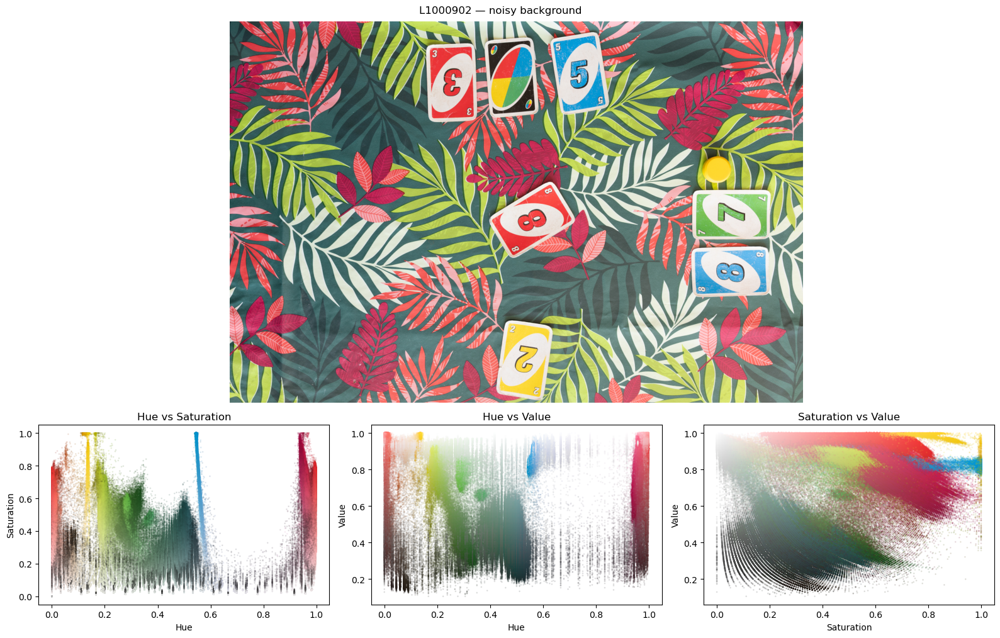

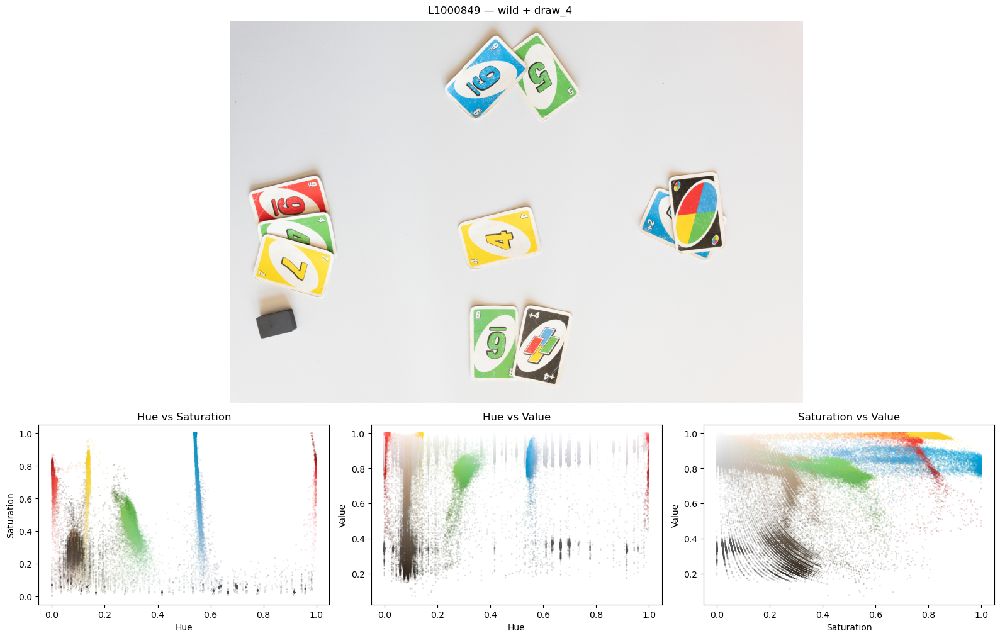

In [58]:
# Cell — Sample HSV values from hardest cases
sample_cards = {
    'L1000902': 'noisy background',
    'L1000849': 'wild + draw_4',
}

for img_id, description in sample_cards.items():
    img = np.array(Image.open(f'train_images/{img_id}.jpg'))
    data_h, data_s, data_v = extract_hsv_channels(img)
    
    plot_colors_histo(
        img=img,
        func=extract_hsv_channels,
        labels=['Hue', 'Saturation', 'Value']
    )
    plt.suptitle(f'{img_id} — {description}', y=1.01)
    plt.show()

Looking at both of our images : 
    from our wild card we notice : 
Red: H ~0.0 and ~0.95-1.0, S > 0.7
Yellow: H ~0.12-0.16, S > 0.7
Green: H ~0.28-0.38, S ~0.4-0.6
Blue: H ~0.55-0.60, S > 0.8 (very tight vertical line)
Wild/draw_4: H ~0.0-0.1, S < 0.3, V < 0.5 (black cluster bottom-left)
Token: S < 0.2, V < 0.4 (dark cluster)

    from our noisy background card :
Card clusters are visible but overlapping with leaves
Key differentiator: cards have higher V than leaves at same S


In [59]:
def apply_hsv_threshold(img):
    """
    Apply color-specific HSV thresholds to detect card and token regions.
    Thresholds derived from HSV scatter plot analysis, tuned on both
    white background (L1000849) and noisy background (L1000902).

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.

    Return
    ------
    img_th: np.ndarray (M, N)
        Raw binary mask before morphology.
    """
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))

    data_h, data_s, data_v = extract_hsv_channels(img=img)

    # Red: wraps around 0 and 1, strict V to exclude pinkish leaves
    red_mask = (
        ((data_h < 0.05) | (data_h > 0.95)) &
        (data_s > 0.65) &
        (data_v > 0.85)  # tightened from 0.80
    )

    # Yellow: narrow hue band, high V
    yellow_mask = (
        (data_h > 0.10) & (data_h < 0.16) &
        (data_v > 0.60)
    )

    # Green: strict V range to exclude dark leaf greens
    green_mask = (
        (data_h > 0.25) & (data_h < 0.42) &
        (data_v > 0.60) & (data_v < 0.88) &  # tightened from 0.55
        (data_s > 0.20)
    )

    # Blue: tight hue, high saturation
    blue_mask = (
        (data_h > 0.50) & (data_h < 0.65) &
        (data_s > 0.40) &
        (data_v > 0.30)
    )

    # Token + wild/draw_4: dark regions
    dark_mask = (
        (data_v < 0.55) &
        (data_s < 0.31) &
        (data_h < 0.12)
    )

    # Combine
    img_th = red_mask | yellow_mask | green_mask | blue_mask | dark_mask

    # Global saturation filter — kills leaves, protects dark mask
    high_sat = data_s > 0.46
    img_th = img_th & (high_sat | dark_mask)

    return img_th


def apply_morphology(img_th):
    """
    Apply morphological operations to clean up the binary mask.
    Removes noise, fills card regions, and removes small objects.

    Args
    ----
    img_th: np.ndarray (M, N)
        Raw binary mask from apply_hsv_threshold.

    Return
    ------
    img_th: np.ndarray (M, N)
        Cleaned binary mask after morphology.
    """
    img_th = remove_small_objects(img_th.astype(bool), min_size=13)
    img_th = closing(img_th.astype(bool), disk(9))
    img_th = opening(img_th.astype(bool), disk(6))
    img_th = remove_small_objects(img_th.astype(bool), min_size=6000)
    img_th = remove_small_holes(img_th.astype(bool), area_threshold=5000)

    return img_th

C:\Users\hanna\AppData\Local\Temp\ipykernel_26984\3636265214.py:81: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  img_th = remove_small_objects(img_th.astype(bool), min_size=13)
C:\Users\hanna\AppData\Local\Temp\ipykernel_26984\3636265214.py:84: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  img_th = remove_small_

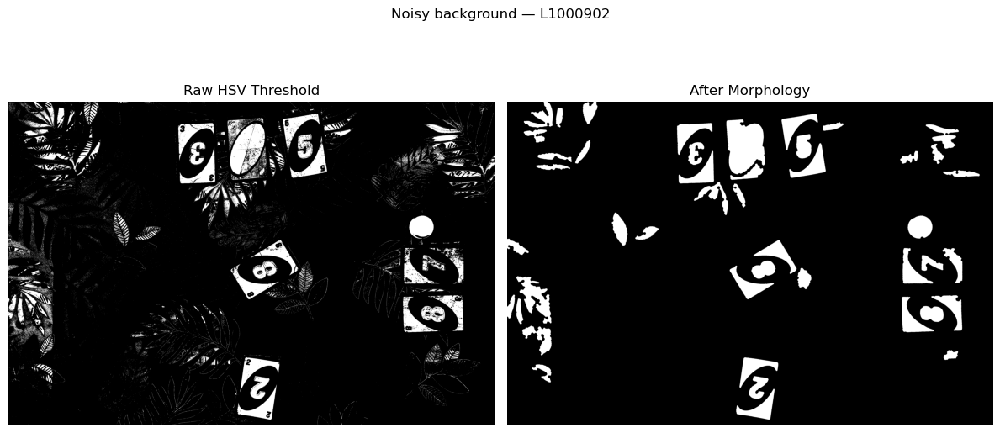

In [60]:
#only testing on the noisy background image since the white background is already very clean
test_images = {
    'L1000849': 'wild + draw_4',
    'L1000902': 'noisy background',
    'L1000782': 'reverse card',
    'L1000855': 'skip card',
}
img_th = apply_hsv_threshold(np.array(Image.open(f'train_images/L1000902.jpg')))
img_th_clean = apply_morphology(img_th) 
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img_th, cmap='gray')
axes[0].set_title('Raw HSV Threshold')
axes[0].axis('off')
axes[1].imshow(img_th_clean, cmap='gray')
axes[1].set_title('After Morphology')
axes[1].axis('off')
plt.suptitle('Noisy background — L1000902', fontsize=12)
plt.tight_layout()
plt.show()


C:\Users\hanna\AppData\Local\Temp\ipykernel_26984\3530994666.py:12: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  img_clean = remove_small_objects(img_th, min_size=13)
C:\Users\hanna\AppData\Local\Temp\ipykernel_26984\3530994666.py:15: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  img_clean = remove_small_objects

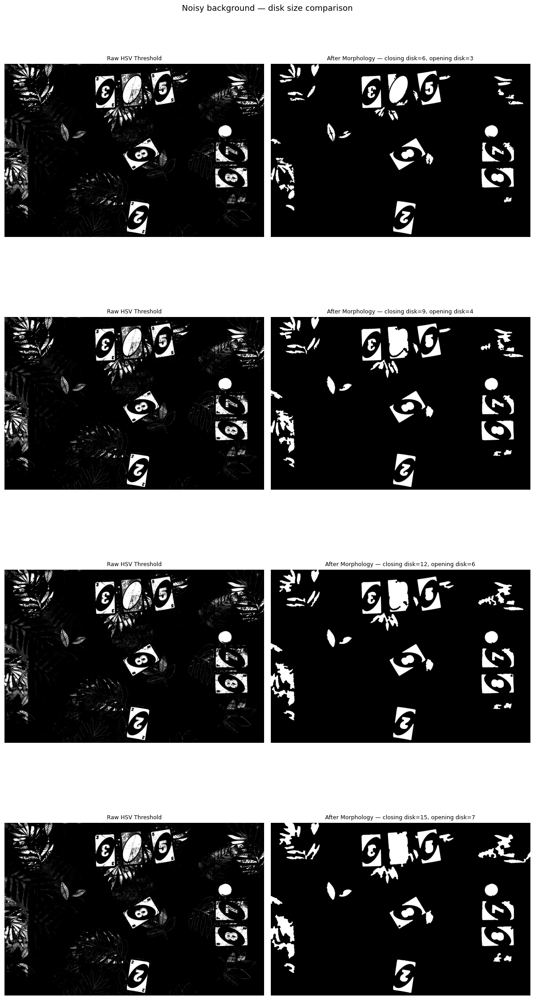

In [61]:
#testing multiple disk sizes for closing on noisy background image

disk_sizes = [6, 9, 12, 15]

img_noisy = np.array(Image.open('train_images/L1000902.jpg'))
img_th = apply_hsv_threshold(img_noisy)

fig, axes = plt.subplots(len(disk_sizes), 2, figsize=(12, 6 * len(disk_sizes)))

for i, d in enumerate(disk_sizes):
    # Apply morphology with different disk sizes
    img_clean = remove_small_objects(img_th, min_size=13)
    img_clean = closing(img_clean, disk(d))
    img_clean = opening(img_clean, disk(d // 2))
    img_clean = remove_small_objects(img_clean, min_size=4500)
    img_clean = remove_small_holes(img_clean, area_threshold=5000)

    axes[i, 0].imshow(img_th, cmap='gray')
    axes[i, 0].set_title(f'Raw HSV Threshold', fontsize=9)
    axes[i, 0].axis('off')

    axes[i, 1].imshow(img_clean, cmap='gray')
    axes[i, 1].set_title(f'After Morphology — closing disk={d}, opening disk={d//2}', fontsize=9)
    axes[i, 1].axis('off')

plt.suptitle('Noisy background — disk size comparison', fontsize=13)
plt.tight_layout()
plt.show()

C:\Users\hanna\AppData\Local\Temp\ipykernel_26984\3636265214.py:81: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  img_th = remove_small_objects(img_th.astype(bool), min_size=13)
C:\Users\hanna\AppData\Local\Temp\ipykernel_26984\3636265214.py:84: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  img_th = remove_small_

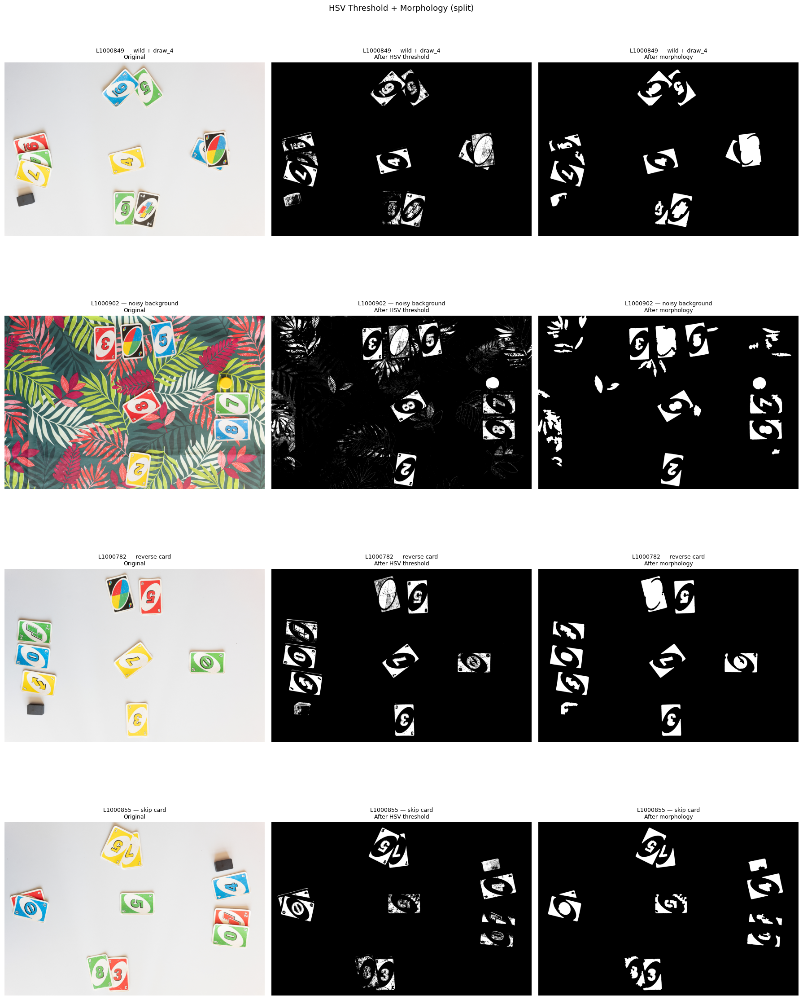

In [62]:
# Cell — Test both functions together
test_images = {
    'L1000849': 'wild + draw_4',
    'L1000902': 'noisy background',
    'L1000782': 'reverse card',
    'L1000855': 'skip card',
}

fig, axes = plt.subplots(4, 3, figsize=(18, 24))

for i, (img_id, description) in enumerate(test_images.items()):
    img = np.array(Image.open(f'train_images/{img_id}.jpg'))
    img_th = apply_hsv_threshold(img)
    img_clean = apply_morphology(img_th)

    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f'{img_id} — {description}\nOriginal', fontsize=9)
    axes[i, 0].axis('off')

    axes[i, 1].imshow(img_th, cmap='gray')
    axes[i, 1].set_title(f'{img_id} — {description}\nAfter HSV threshold', fontsize=9)
    axes[i, 1].axis('off')

    axes[i, 2].imshow(img_clean, cmap='gray')
    axes[i, 2].set_title(f'{img_id} — {description}\nAfter morphology', fontsize=9)
    axes[i, 2].axis('off')

plt.suptitle('HSV Threshold + Morphology (split)', fontsize=13)
plt.tight_layout()
plt.show()

Region growing was considered as an alternative to morphology operations for consolidating card regions, but was eventually deemed unnecessary as closing and hole-filling produced sufficiently solid blobs for contour detection.

## Part 1.5 - Final Comparison

The figure above shows the segmentation pipeline applied to four representative images, covering both background types and special card cases. For white background images(L1000849, L1000782, L1000855), the HSV threshold already produces a clean mask with clearly separated card regions, and morphology further consolidates them into solid blobs with minimal noise. The active player token is preserved in all cases as a small distinct region, which will be used for active player detection in a later stage.

The noisy background image (L1000902) is the most challenging case because the raw HSV threshold captures significant leaf noise alongside the cards, but morphology successfully eliminates most small leaf fragments via `remove_small_objects`. Some residual leaf blobs remain after morphology, particularly in regions where leaf colors closely overlap with card colors in HSV space. These will be further filtered at the contour detection stage using shape-based criteria, as leaves and cards have fundamentally different geometries : cards are rectangular while leaves are elongated and irregular.

Overall, the HSV threshold + morphology pipeline produces segmentation results that are sufficient for the next stage of the pipeline: contour detection and shape-based filtering.